# Train 3D network on Memento with captions

In [1]:
# Imports
import sys
print("sys.executable:",sys.executable)

import numpy as np
import keras
import tensorflow as tf
import os
import sys
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from keras.optimizers import Adam, SGD
import pickle
import json
import h5py

sys.path.append('../src/')
from generator import VideoSeqGenerator, preprocess_rgb_fast, load_vids_opencv
from vid_utils import load_video_opencv, plot_frames
from memento_utils import *
from captioning_utils import *
import i3d_config as cfg
from keras_models import build_i3d_custom, build_model_multigpu
from keras_radam import RAdam
from keras_lookahead import Lookahead
import seaborn as sns

%load_ext autoreload
%autoreload 2


sys.executable: /usr/bin/python3


Using TensorFlow backend.
/home/camilo/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/camilo/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/camilo/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/camilo/.local/lib/python3.6/site-packages/tensorflow/python

In [2]:
print(cfg._VOCAB_PATH)

../../memento_data/vocab_3.json


In [3]:
import keras
import tensorflow as tf
import numpy as np
print("keras version:", keras.__version__)
print("tf version:", tf.__version__)
print("np version:", np.__version__)

keras version: 2.3.1
tf version: 1.14.0
np version: 1.19.2


In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '1'
print(os.environ['CUDA_VISIBLE_DEVICES'])

1


In [5]:
%%bash
nvidia-smi

Wed Oct  7 12:40:57 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 450.57       CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  TITAN RTX           On   | 00000000:1A:00.0 Off |                  N/A |
| 40%   32C    P8    24W / 280W |     11MiB / 24220MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  TITAN RTX           On   | 00000000:68:00.0 Off |                  N/A |
| 40%   

# Key vars

In [6]:
data_type = 'rgb'
dataset = 'memento10k'
gpus = 1
resc = 1
use_sw = 0
bs = 12
do = 0.3
loss_type = 'alphamse'

# Fetch video names, alphas, memorability scores and captions


In [7]:
if os.uname()[1] == 'visiongpu30':
    data_path = '../../../moments_raw/sources_numpy_256/' if data_type=='rgb' else '../../../moments_flow/sources_flow_down1_tvl1_skip1/'
    labels_path = '../../memento_data/'
    names_with_slash = False
elif os.uname()[1] == 'cfosco-lambda':
    data_path = '../../../../../../Datasets/memento_raw/sources_numpy_256/' if data_type=='rgb' else '../../../../../../Datasets/memento_raw/sources_flow_down1_tvl1_skip1/'
    labels_path = '../../memento_data/'
    names_with_slash = False
else:
    data_path = '../../memento'
    labels_path = '../../memento_data'
    names_with_slash = True

caption_format='index_list'
    
# Fetch scores from ground truth json file with a defined T
# T = 80
# mem_scores_file = 'normalized_mem_scores_ma_T=%d.json' % T
# alpha_file = 'alphas_ma_T=%d.json' % T



# name_to_mem_alpha, name_to_mem, name_to_alpha =  get_name_to_mem_dict(mem_scores_file, 
#                                                                  alpha_file, 
#                                                                  labels_path, 
#                                                                  names_with_slash=names_with_slash)


# # print(name_to_mem_alpha)
# train_names, val_names, test_names = get_train_test_sets_from_json(os.path.join(labels_path, 'memento_train_val_test.json'), 
#                                              names_with_slash=names_with_slash, return_test=True)

train_data = '../../../../../../Dropbox/Graduate Studies/MIT/Research/memento_project/memento/memento_train_data.json' 
val_data = '../../../../../../Dropbox/Graduate Studies/MIT/Research/memento_project/memento/memento_val_data.json' 
test_data = '../../../../../../Dropbox/Graduate Studies/MIT/Research/memento_project/memento/memento_test_data.json' 

train_names, val_names, test_names, name_to_mem_alpha, train_captions, val_captions, test_captions = get_memento_data(train_data, val_data, test_data)
    

# n_captions=3
# input_captions_train_old, target_captions_train_old = prepare_caption_data('../../memento_data/memento_train_tokenized_captions_3.json',
#                                                                    word_embeddings='../../memento_data/vocab_embedding_3.json',
#                                                                    return_backward=False, 
#                                                                    caption_format=caption_format,
#                                                                   names_with_slash=names_with_slash)

input_captions_train, target_captions_train = prepare_caption_data(train_captions,
                                                                   word_embeddings='../../memento_data/vocab_embedding_3.json',
                                                                   return_backward=False, 
                                                                   caption_format=caption_format,
                                                                  names_with_slash=names_with_slash)


input_captions_val, target_captions_val = prepare_caption_data(val_captions, 
                                                                   word_embeddings='../../memento_data/vocab_embedding_3.json',
                                                                   return_backward=False, 
                                                                   caption_format=caption_format,
                                                                  names_with_slash=names_with_slash)

input_captions_test, target_captions_test = prepare_caption_data(test_captions, #'../../memento_data/memento_test_tokenized_captions_3.json', 
                                                                   word_embeddings='../../memento_data/vocab_embedding_3.json',
                                                                   return_backward=False, 
                                                                   caption_format=caption_format,
                                                                  names_with_slash=names_with_slash)



# tok = tf.keras.preprocessing.text.Tokenizer(
#     num_words=None, filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n', lower=True,
#     split=' ', char_level=False, oov_token=None, document_count=0, **kwargs
# )




embedding_matrix = get_embedding_matrix('../../memento_data/vocab_embedding_3.json',
                                        '../../memento_data/vocab_3.json')

print("embedding_matrix.shape:",embedding_matrix.shape)


## FUSE LABEL_DICTIONARIES
str2label_train = add_caption_to_str2label(name_to_mem_alpha, target_captions_train)
str2label_val = add_caption_to_str2label(name_to_mem_alpha, target_captions_val)
str2label_test = add_caption_to_str2label(name_to_mem_alpha, target_captions_test)

# i=0
# for k,v in str2label_train.items():
#     print(k)
#     print([to_words(c) for c in v[2]])
#     i+=1
#     if i >10:
#         break

# for k,v in input_captions_train.items():s
#     print(k)
#     print(len(v))
#     for cap in v:
#         for word in cap:
#             print(word)
#     break

print('Loaded %d train videos and %d val videos\n' % (len(train_names), len(val_names)))
 
# Check if all names are in dict
train_not_in_dict=0
for tn in train_names:
    if tn not in input_captions_train.keys():
        print('Train vid not in dict:',tn)
        train_not_in_dict+=1
print('train_not_in_dict',train_not_in_dict)
        
val_not_in_dict=0
for tn in val_names:
    if tn not in input_captions_val.keys():
        print('Val vid not in dict:',tn)
        val_not_in_dict+=1
print("val_not_in_dict",val_not_in_dict)


CAPTIONS ALREADY TOKENIZED
['adult+female+singing/peeks-www_k_to_keek_2Qwueab_25.mp4', 'adult+female+singing/peeks-www_k_to_keek_2Xyqeab_3.mp4', 'adult+female+singing/peeks-www_k_to_keek_2g4teab_28.mp4', 'adult+female+singing/peeks-www_k_to_keek_EO30eab_19.mp4', 'adult+female+singing/peeks-www_k_to_keek_J2Rveab_1.mp4']
[{'indexed_captions': [[2986, 2985, 2852, 2777, 2945, 2978, 2892, 2841, 2873, 2783, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2986, 2985, 2852, 2777, 2945, 2939, 2873, 2115, 2938, 2708, 2981, 1795, 2892, 2702, 2380, 2783, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2986, 2985, 2945, 2978, 2852, 2777, 2981, 251, 2873, 2783, 2954, 2984, 2934, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2986, 2985, 2952, 2963, 2957, 2985, 2705, 2759, 2829, 29

In [8]:
# for k in sorted(input_captions_train_old, key=input_captions_train_old.get)[:3]:
#     print(k)
#     print(input_captions_train_old[k])
# print()
# for k in sorted(input_captions_train, key=input_captions_train.get)[:3]:
#     print(k)
#     print(input_captions_train[k])

# for k in sorted(target_captions_train, key=target_captions_train.get)[:3]:
#     print(k)
#     print(target_captions_train[k])   

In [9]:
for k,v in target_captions_val.items():
    print(k,v)
    break

# print(np.min(target_captions_train.values()), np.max(target_captions_train.values()))

adult-male-singing_peeks-www_k_to_keek_vqfgeab_6.npy [[2985, 2277, 2830, 2983, 2635, 2979, 2827, 2843, 2985, 2762, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2985, 2942, 2979, 2827, 2937, 2985, 2779, 2967, 2984, 2934, 2819, 2954, 2832, 2977, 2984, 1021, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2985, 2968, 2979, 2827, 2937, 2985, 2779, 2973, 2980, 2985, 2932, 2981, 2912, 2583, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2985, 2952, 2975, 2979, 2827, 2972, 2985, 2779, 2702, 2984, 2934, 2576, 2977, 2918, 2779, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2985, 2963, 2753, 2937, 2985, 2779, 2981, 2984, 2934, 2576, 2869, 2938, 2987, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [11]:
# Plot distribution of words in the training examples

counts={}
word2idx={}

counts[0]=0

for i,w in enumerate(json.load(open(cfg._VOCAB_PATH))):
    counts[i+1]=0
    word2idx[w]=i+1
    

i=0
for k,v in target_captions_train.items():
    for caption in v:
        for w in caption:
#             if not w: continue
            counts[w]+=1
        
print(len(counts), len(embedding_matrix))
print("Counts of word 'a'", counts[2985])
print("Counts of padding token", counts[0])
print("Counts of <end> token (also number of total captions)", counts[2987])
print("Sum of all counts:", np.sum(list(counts.values())))

# plt.figure(figsize=[3,600])
# plt.barh([to_words(k) for k in list(counts.keys())], counts.values())
# plt.show()

2988 2988
Counts of word 'a' 61593
Counts of padding token 1347165
Counts of <end> token (also number of total captions) 35000
Sum of all counts: 1820000


In [12]:
len(np.unique(np.array(list(input_captions_train.values())).flatten()))

2982

In [13]:
# np.unique(input_captions_train.values().flatten())

In [14]:
cts = np.array([counts[i] for i in range(len(counts))])
freq=cts/np.sum(cts)
logfreq = np.log(freq)
logfreq[np.where(cts==0)] = -1e5
print("logfreq",logfreq)
    
word_weights={}
for i,c in enumerate(cts):
    word_weights[i] = 1/c if c!=0 else 0

# 'a'= 2985
print("For word a: freq[2985] = %.7f, word_weights[2985] = %.7f " %(freq[2985], word_weights[2985]))

# plt.figure(figsize=[5,600])
# plt.barh([to_words(k) for k in list(word_weights.keys())], word_weights.values())
# plt.show()

logfreq [-3.00834117e-01 -1.30280527e+01 -1.23349055e+01 ... -3.38604355e+00
 -1.00000000e+05 -3.95124372e+00]
For word a: freq[2985] = 0.0338423, word_weights[2985] = 0.0000162 


/home/camilo/.local/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


In [15]:
# logfreq [-3.21406401e-01 -1.22554341e+01 -1.22554341e+01 ... -3.36579496e+00
#  -1.00000000e+05 -3.91202301e+00]
# For word a: freq[2985] = 0.0345346, word_weights[2985] = 0.0000276 

## Get mem weights if needed

In [16]:
if use_sw:
    factor = 3
    mem_weights = get_sample_weights([name_to_mem_alpha[n][0] for n in train_names], factor=factor)
    alpha_weights = get_sample_weights([name_to_mem_alpha[n][1] for n in train_names], factor=factor)
    
    sw=np.array(mem_weights)
else:
    sw=None

In [17]:
print([name_to_mem_alpha[n] for n in train_names][:10])
# print(mem_weights[:10])

[array([ 9.89151448e-01, -3.86640754e-04]), array([9.13390932e-01, 4.10293421e-04]), array([ 9.32910372e-01, -5.18010452e-04]), array([ 9.66062043e-01, -1.07779651e-04]), array([ 9.44807588e-01, -6.62044493e-04]), array([ 9.23569664e-01, -5.26515300e-04]), array([8.46147085e-01, 9.04769044e-06]), array([ 9.36736706e-01, -4.33197477e-04]), array([ 9.91672655e-01, -3.36745889e-04]), array([ 0.61340055, -0.00138345])]


# Generator

In [18]:
# Instantiating generator

if caption_format=='index_triangular_matrix':
    load_func = load_npy_and_partial_caption
    load_labels_func = load_labels_mem_alpha_words

elif caption_format=='index_list':
    load_func = load_npy_and_full_caption
    load_labels_func = load_labels_mem_alpha_caption

gen_train = VideoSeqGenerator(files=np.array(train_names),
                            batch_size=bs, 
                            dataset_path=data_path,
                            label_csv= None, 
                            augment= None, #['dropout', 'cutout'],
                            load_func=load_func,
                            load_labels_func=load_labels_func,
                            preprocess_func='cap_fast_'+data_type,
                            remove_excess_files=False,
                            shuffle=True,
                            is_train=True,
                            verbose=True,
                            str2label_dict = str2label_train,
                            sample_weights=sw,
                            input_captions = input_captions_train)

gen_val = VideoSeqGenerator(files=np.array(val_names),
                            batch_size=bs, 
                            dataset_path=data_path,
                            label_csv=None,
                            augment=None,
                            load_func=load_func,
                            load_labels_func=load_labels_func,
                            preprocess_func='cap_fast_'+data_type,
                            remove_excess_files=False,
                            shuffle=False,
                            is_train=False,
                            verbose=True,
                            str2label_dict = str2label_val,
                            sample_weights=sw,
                           input_captions = input_captions_val)

gen_test = VideoSeqGenerator(files=np.array(test_names),
                            batch_size=bs, 
                            dataset_path=data_path,
                            label_csv=None,
                            augment=None,
                            load_func=load_func,
                            load_labels_func=load_labels_func,
                            preprocess_func='cap_fast_'+data_type,
                            remove_excess_files=False,
                            shuffle=False,
                            is_train=False,
                            verbose=True,
                            str2label_dict = str2label_test,
                            sample_weights=sw,
                           input_captions = input_captions_test)

gen_val_mini = VideoSeqGenerator(files=np.array(val_names)[:20],
                            batch_size=bs, 
                            dataset_path=data_path,
                            label_csv=None,
                            augment=None,
                            load_func=load_func,
                            load_labels_func=load_labels_func,
                            preprocess_func='cap_fast_'+data_type,
                            remove_excess_files=False,
                            shuffle=False,
                            is_train=False,
                            verbose=True,
                            str2label_dict = str2label_val,
                            sample_weights=sw,
                           input_captions = input_captions_val)

Caution: batch_size (12) is not multiple of given dataset length (7000). This can cause issues with multigpu training.
Calling VideoSeqGenerator. Batch size:  12 . Number of files received: 7000 . Augmentation:  None
Calling VideoSeqGenerator. Batch size:  12 . Number of files received: 1500 . Augmentation:  None
Calling VideoSeqGenerator. Batch size:  12 . Number of files received: 1500 . Augmentation:  None
Caution: batch_size (12) is not multiple of given dataset length (20). This can cause issues with multigpu training.
Calling VideoSeqGenerator. Batch size:  12 . Number of files received: 20 . Augmentation:  None


# Test Generator


Total time on this batch: 0.5416548419743776  - it: 0 - idx: 10
Time loading: 0.3458595681004226
Time preprocessing: 0.19578993879258633
Time augmenting: 5.335081368684769e-06
Input caption to network: ['<start>', 'a', 'crowd', 'of', 'people', 'walk', 'along', 'a', 'plaza', 'as', 'they', 'look', 'at', 'a', 'stage', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'crowd', 'of', 'people', 'walk', 'along', 'a', 'plaza', 'as', 'they', 'look', 'at', 'a', 'stage', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.689470374067428 -0.004331519638107216 255.0 0.0


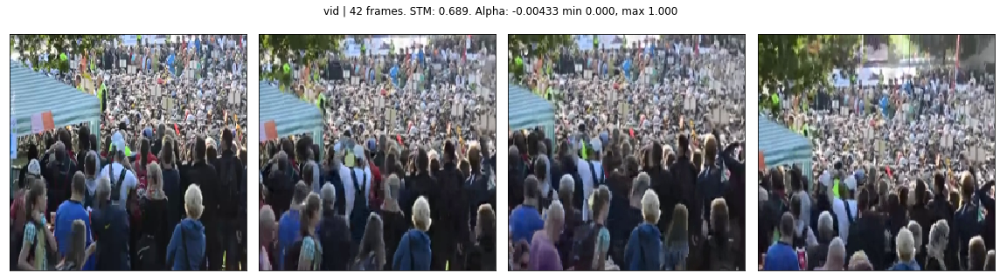

Input caption to network: ['<start>', 'a', 'few', 'people', 'dance', 'around', 'on', 'a', 'blue', 'surface', 'with', 'each', 'other', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'few', 'people', 'dance', 'around', 'on', 'a', 'blue', 'surface', 'with', 'each', 'other', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.7139796895520858 -0.0018604393055687966 255.0 0.0


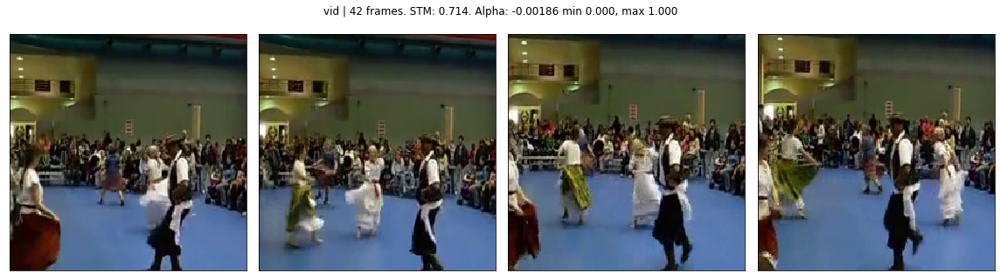

Input caption to network: ['<start>', 'a', 'toddler', 'is', 'running', 'into', 'a', 'room', 'with', 'an', 'adult', 'following', 'close', 'behind', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'toddler', 'is', 'running', 'into', 'a', 'room', 'with', 'an', 'adult', 'following', 'close', 'behind', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.6717912698153773 -0.002430524237114768 175.0 0.0


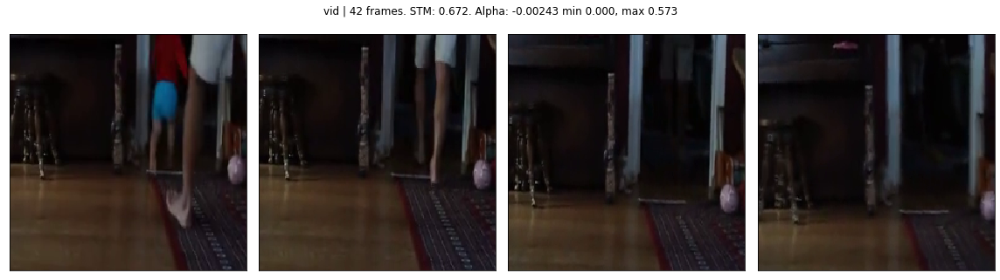

Input caption to network: ['<start>', 'a', 'cat', 'sits', 'in', 'a', 'basket', 'and', 'moves', 'around', 'and', 'then', 'keeps', 'doing', 'it', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'cat', 'sits', 'in', 'a', 'basket', 'and', 'moves', 'around', 'and', 'then', 'keeps', 'doing', 'it', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.8995878786607061 -0.0012327210529276176 255.0 0.0


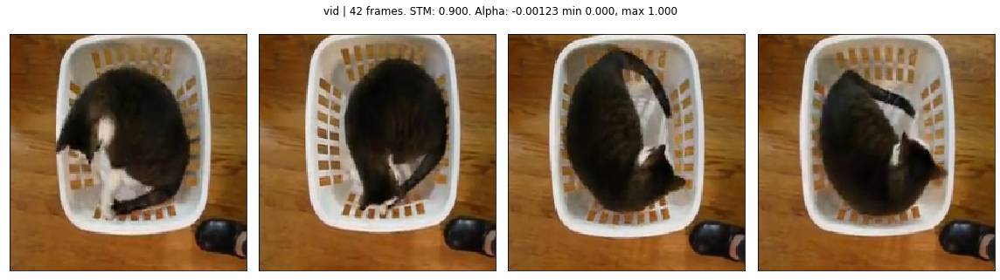

Input caption to network: ['<start>', 'a', 'large', 'crowd', 'of', 'people', 'sing', 'and', 'dance', 'while', 'attending', 'a', 'party', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'large', 'crowd', 'of', 'people', 'sing', 'and', 'dance', 'while', 'attending', 'a', 'party', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.6441577251605627 -0.0003440507401989094 255.0 0.0


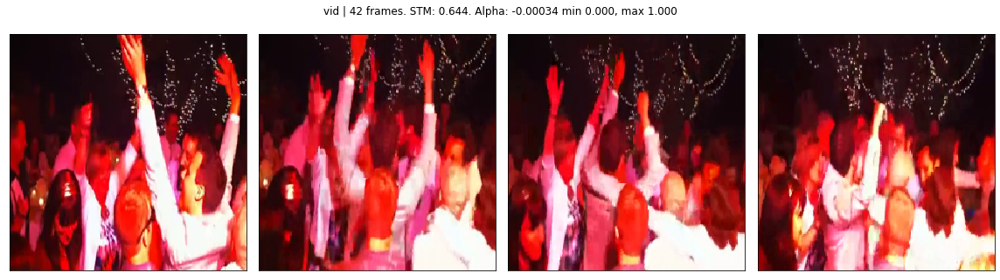

Input caption to network: ['<start>', 'many', 'fireworks', 'go', 'off', 'at', 'a', 'stadium', 'while', 'many', 'people', 'cheer', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['many', 'fireworks', 'go', 'off', 'at', 'a', 'stadium', 'while', 'many', 'people', 'cheer', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.6248638406957381 -0.0007855747182072288 255.0 0.0


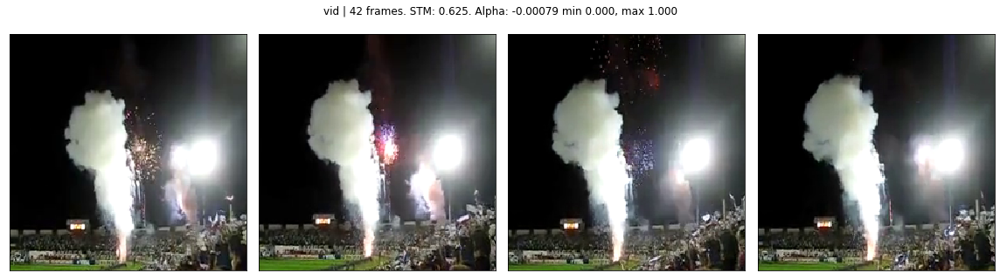

Input caption to network: ['<start>', 'a', 'large', 'group', 'of', 'people', 'are', 'packed', 'under', 'a', 'large', 'tent', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'large', 'group', 'of', 'people', 'are', 'packed', 'under', 'a', 'large', 'tent', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.8148424916367242 -0.0023140977987031763 255.0 0.0


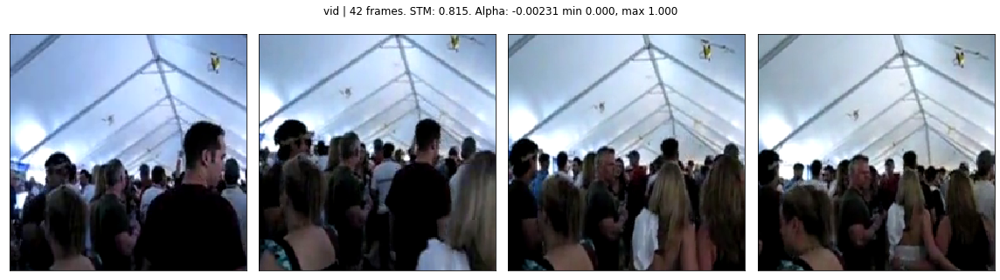

Input caption to network: ['<start>', 'a', 'few', 'people', 'have', 'fun', 'on', 'the', 'field', 'of', 'a', 'baseball', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'few', 'people', 'have', 'fun', 'on', 'the', 'field', 'of', 'a', 'baseball', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.6949847361332464 -0.0018345759127903847 255.0 0.0


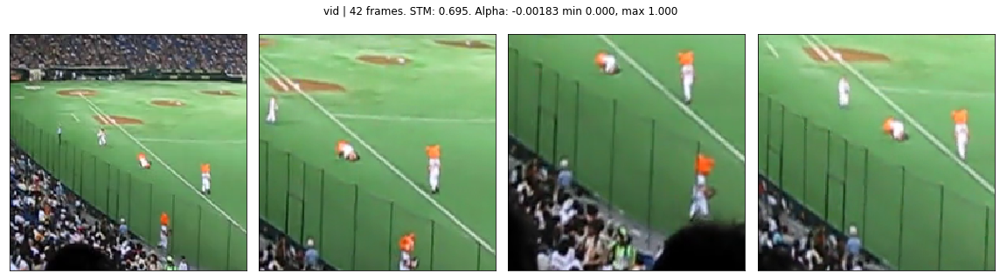

Input caption to network: ['<start>', 'a', 'crowd', 'of', 'people', 'their', 'while', 'watching', 'a', 'concert', 'on', 'stage', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'crowd', 'of', 'people', 'their', 'while', 'watching', 'a', 'concert', 'on', 'stage', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.8427722688696677 -0.0002493307185344221 255.0 0.0


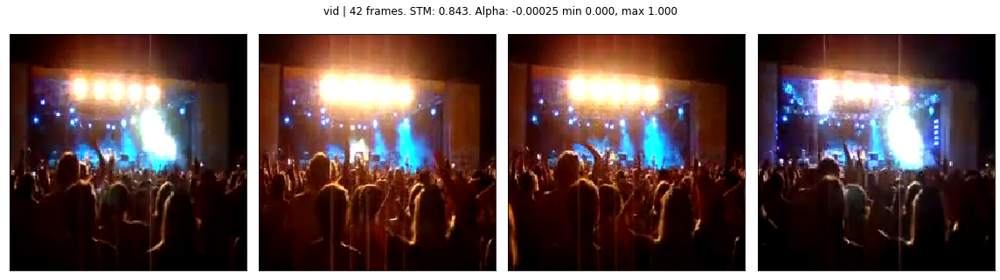

Input caption to network: ['<start>', 'several', 'people', 'clap', 'behind', 'a', 'birthday', 'cake', 'that', 'has', 'a', 'single', 'lit', 'candle', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['several', 'people', 'clap', 'behind', 'a', 'birthday', 'cake', 'that', 'has', 'a', 'single', 'lit', 'candle', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.7520905811176464 -0.0005432459839437024 255.0 0.0


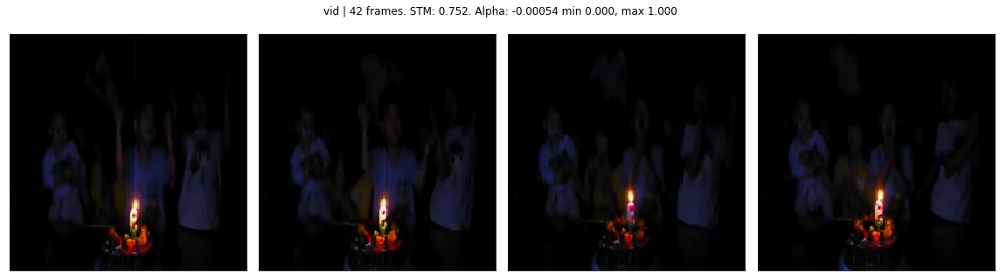

Input caption to network: ['<start>', 'a', 'group', 'of', 'reaches', 'their', 'hands', 'into', 'the', 'center', 'as', 'one', 'speaks', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'group', 'of', 'reaches', 'their', 'hands', 'into', 'the', 'center', 'as', 'one', 'speaks', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.7254861540760867 -0.002823379559345973 255.0 0.0


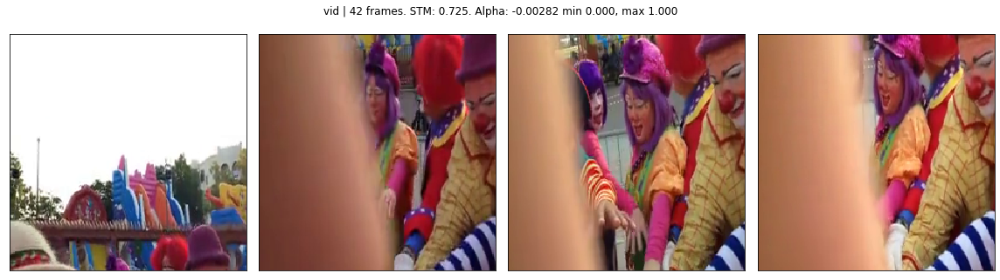

Input caption to network: ['<start>', 'a', 'man', 'performs', 'under', 'the', 'spotlight', 'on', 'stage', 'to', 'a', 'crowd', 'of', 'people', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
Sentence to predict: ['a', 'man', 'performs', 'under', 'the', 'spotlight', 'on', 'stage', 'to', 'a', 'crowd', 'of', 'people', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
mem, alpha, np.max(b), np.min(b) 0.7291361344442638 -0.0020260693169835177 255.0 0.0


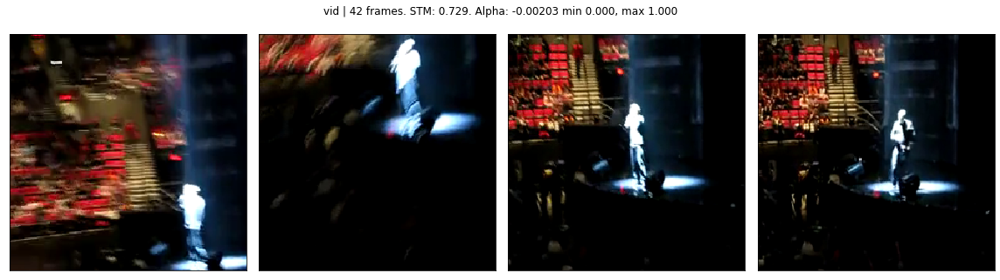

In [19]:
# Test with one batch of memento training

ret = gen_test.__getitem__(10) #np.random.randint(len(gen_val)))

video_batch=ret[0][0]
captions_batch = ret[0][1]
labels=ret[1]


# Display
for i,b in enumerate(video_batch):
    
    captions = captions_batch[i]
    
    (mem,alpha) = labels[0][i]
    cap_label = labels[1][i]
    
    print("Input caption to network:", to_words(captions))
    if caption_format=='index_triangular_matrix':
        print("Word to predict:", to_words(np.argmax(cap_label)))
    elif caption_format=='index_list':    
        print("Sentence to predict:", to_words([np.argmax(w) for w in cap_label]))

    print('mem, alpha, np.max(b), np.min(b)',mem, alpha, np.max(b), np.min(b))
    
    plot_frames(b, 
                title='%s | %d frames. STM: %.3f. Alpha: %.5f' % ('vid',len(b),mem,alpha),
                is_optical_flow=True if data_type=='flow' else False,
                suptitle_y=0.89,
                is_255image=True, 
                frames_to_show=4)

# Model

In [20]:
# Fetching pretrained i3d

i3d = build_model_multigpu(type=data_type, 
                           model_type='i3d_cap_sentence_early',
                           image_size=cfg._IMAGE_SIZE,
                           num_frames=cfg._NUM_FRAMES, 
                           num_classes=2,
                           gpus=gpus,
                           use_pretrained=True, 
                           verbose=True, 
                           download_weights=True,
                           downsample_factor=None, 
                           dropout_prob=do, 
                           final_activation='tanh', 
                           show_internal_summary=False,
                           rescale=resc,
                           embedding_matrix=embedding_matrix,
                           output_biases=logfreq)

#weight file keys: ['Conv3d_6a_1x1_conv', 'cap_words_lstm1', 'cap_words_lstm2', 'embedding_4', 
# 'i3d_inception', 'initial_state_dense_c', 'initial_state_dense_h', 'input_11', 'input_12', 'lambda_14', 
# 'lambda_15', 'lambda_16', 'output_classes', 'reshape_8', 'td_output_captions', 'time_distributed_4']

Working with single GPU
x.shape after downsa: (?, 21, 28, 28, 192)
channels_last
x.shape after last conv: (?, 5, 1, 1, 400)
Loading downloaded weights into model: rgb_imagenet_and_kinetics from path: /home/camilo/.keras/models/i3d_inception_rgb_imagenet_and_kinetics.h5
video_out.shape (internal representation over 5 pseudo-frames) (?, 5, 1, 1, 1024)
x.shape after last conv (?, 5, 1, 1, 2)
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
out_mem.shape, out_captions.shape (?, 2) (?, ?, 2988)
Model: "i3d_captions"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 42, 224, 224, 0                                            
__________________________________________________________________________________________________
lambda_2 (Lambda)               (None, 42,

In [21]:
# inp = Input((None, 300))
# x = keras.layers.recurrent.LSTM(units=512, return_sequences=True)(inp)

# m = Model(inp, x)
# m.summary()

In [30]:
%%bash
cd ../ckpt/i3d_cap2
ls -lrt

total 3026104
-rw-rw-r-- 1 camilo camilo 79445488 Nov 30  2019 memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep01_valloss12.7862_valrc0.5974_capacc0.387.hdf5
-rw-rw-r-- 1 camilo camilo 79445488 Nov 30  2019 memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep03_valloss12.5684_valrc0.5940_capacc0.397.hdf5
-rw-rw-r-- 1 camilo camilo 79445488 Nov 30  2019 memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep05_valloss13.4522_valrc0.5869_capacc0.396.hdf5
-rw-rw-r-- 1 camilo camilo 79445488 Nov 30  2019 memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep08_valloss12.3846_valrc0.5818_capacc0.390.hdf5
-rw-rw-r-- 1 camilo camilo 79445488 Nov 30  2019 memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep10_valloss13.2629_valrc0.5956_capacc0.389.hdf5
-rw-rw-r-- 1 camilo camilo 79445488 Nov 30  2019 memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep11_valloss13.1357_valrc0.

In [22]:
# Load weights -  careful when loading ani3d_cap model: you might overwrite the initialized biases
# for l in i3d.layers:
#     if l.name == 'i3d_inception':
#         l.trainable=False
#     if l.name == 'Conv3d_6a_1x1_conv':
#         l.trainable=False
        
# for l in i3d.layers:
#     l.trainable=True
    
    
# prefix = '../ckpt/i3d_cap2/'

# W_cap = None # prefix+'memento10k_rgb_fzn1_resc1_LTalphamse_a1b100c10_w0_gpus1_bs16_do0.30_ep07_valloss1031.0853_capacc0.393.hdf5'
# if W_cap:
#     f_cap = h5py.File(W_cap, 'r')
#     print("f_cap keys:",list(f_cap.keys())) # will get a list of layer names which you can use as index

# #     for l in i3d.layers:
# #         if l.name not in ['cap_words_lstm1', 'initial_state_dense_h', 'initial_state_dense_c','cap_words_lstm2', 'embedding_3', 'td_output_captions', 'time_distributed_3']:
# #             l.name = l.name+'_fixed'
#     i3d.load_weights(W_cap)

#  'memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c10_w0_gpus1_bs16_do0.30_ep01_valloss12.2976_valrc0.6252_capacc0.388.hdf5' #  -- CHECKPOINT USED FOR PAPER (DOESNT WORK WELL)
# '../ckpt/i3d_cap2/memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep13_valloss12.9246_valrc0.5998_capacc0.393.hdf5'  -- THIS CHECKPOINT HAS 0.50 rc, NOT 0.599
    
W = '../ckpt/i3d_cap2/memento10k_rgb_fzn0_resc1_LTmse_a1b100c1000_w1_gpus1_bs12_do0.30_ep02_valloss0.8901_valrc0.5998_capacc0.397.hdf5' #'../ckpt/i3d_cap2/memento10k_rgb_fzn0_resc1_LTmse_a1b100c1000_w1_gpus1_bs12_do0.30_ep25_valloss1.1338_valrc0.5957_capacc0.400.hdf5' 
if W:
    f = h5py.File(W, 'r')
    print("f keys:",list(f.keys())) # will get a list of layer names which you can use as index
#     for l in i3d.layers:
#         if 'embedding' in l.name:
#             l.name='embedding_3'
        
#         if 'time_distributed' in l.name:
#             l.name='time_distributed_3'
#     for l in i3d.layers:
#         if l.name in ['cap_words_lstm1', 'initial_state_dense_h', 'initial_state_dense_c', 'cap_words_lstm2', 'embedding_3', 'td_output_captions', 'time_distributed_3']:
#             l.name = l.name+'_fixed'
    i3d.load_weights(W)
            
            
i3d.summary()

f keys: ['Conv3d_6a_1x1_conv', 'cap_words_lstm1', 'cap_words_lstm2', 'embedding_caption', 'i3d_inception', 'initial_state_dense_c', 'initial_state_dense_h', 'input_2', 'input_3', 'lambda_2', 'lambda_3', 'lambda_4', 'output_classes', 'reshape_2', 'td_cap_words_dense_out', 'td_output_captions']
Model: "i3d_captions"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 42, 224, 224, 0                                            
__________________________________________________________________________________________________
lambda_2 (Lambda)               (None, 42, 224, 224, 0           input_2[0][0]                    
__________________________________________________________________________________________________
i3d_inception (Model)           multiple             12294544    lambda_2[0][0]           

In [64]:
# %%bash
# cd "/media/camilo/Elements/Drive C/MIT/models/moments/paper_no_alpha/3d_raw_256_dropout02"
# ls

In [65]:
# W = '/media/camilo/Elements/Drive C/MIT/models/moments/paper_no_alpha/3d_raw_256_dropout02/0031_3d_full.w'
# import h5py
# f = h5py.File(W, 'r')
# print("f keys:",list(f.keys())) # will get a list of layer names which you can use as index
# print(list(f['final_dense'].keys()))
# print(list(f['final_dense']['final_dense_2']['kernel:0'].shape))

In [66]:
# TESTING LOSS
# loss = loss_alpha_mse(print_=True)

# for i in range(5):
#     ret = gen_train.__getitem__(i)
#     batch = ret[0]
#     labels = ret[1]
#     preds = i3d.predict(batch)
#     loss(K.variable(labels), K.variable(preds))

# Train last layers

In [ ]:
### print('TRAINING WITH %d GPUS'%gpus)

for l in i3d.layers:
    if l.name == 'i3d_inception':
        l.trainable=False
#     if l.name == 'Conv3d_6a_1x1_conv':
#         l.trainable=True

# Define optimizer
lr=0.00001
optimizer = Lookahead(RAdam(lr=lr))

print('Compiling model')

# Compile model
loss_type = 'mse'

a=1
b=100
c=1000
if loss_type=='alphamse':
    loss_mem = loss_alpha_mse(a,b,c,bs=bs,T=T) 
elif loss_type=='alpha':
    loss_mem = loss_alpha(bs=bs,T=T)
else:
    loss_mem='mse'
i3d.compile(optimizer=optimizer,
              loss=[loss_mem, 'categorical_crossentropy'],
              loss_weights = [1,0.1],
              metrics=['mse','accuracy'])
    
use_rc=True
ckpt_filepath = get_ckpt_name_cap('../ckpt/i3d_cap2', dataset, data_type, True, resc, gpus, bs, loss_type, use_sw, do, a,b,c, use_rc=use_rc)
cbs = define_callbacks(ckpt_filepath, gen_val, name_to_mem_alpha, val_names, 
                      lr=lr, drop=0.1, epochs_drop=10, ckpt_period=1, use_cb_rankcorr=use_rc)


print('Ready to train last layer')
print('ckpt_filepath:',ckpt_filepath)

# Training
i3d.fit_generator(gen_train, 
                  epochs=15,
                  verbose=1, 
                  callbacks=cbs, 
                  max_queue_size=100,
                  validation_data=gen_val, 
                  workers=10,
                  class_weight=word_weights)



Compiling model
Ready to train last layer
ckpt_filepath: ../ckpt/i3d_cap2/memento10k_rgb_fzn1_resc1_LTmse_a1b100c1000_w0_gpus1_bs12_do0.30_ep{epoch:02d}_valloss{val_loss:.4f}_valrc{rc_val:.4f}_capacc{val_td_output_captions_accuracy:.3f}.hdf5

Epoch 1/15

Total time on this batch: 4.561018586624414  - it: 0 - idx: 302
Time loading: 4.346100749913603
Time preprocessing: 0.21485921368002892
Time augmenting: 5.862303078174591e-05

Total time on this batch: 4.618399860803038  - it: 0 - idx: 2
Time loading: 4.378512525931001
Time preprocessing: 0.23988250410184264
Time augmenting: 4.830770194530487e-06
400/583 [===================>..........] - ETA: 2:15 - loss: 0.0827 - output_classes_loss: 0.0043 - td_output_captions_loss: 0.7839 - output_classes_mse: 0.0043 - output_classes_accuracy: 1.0000 - td_output_captions_mse: 2.3648e-04 - td_output_captions_accuracy: 0.4280
Total time on this batch: 0.9062562170438468  - it: 500 - idx: 361
Time loading: 0.5119180930778384
Time preprocessing: 0.3942

# Train full network

In [60]:

print('TRAINING WITH %d GPUS'%gpus)

for l in i3d.layers:
    l.trainable = True

        
lr=0.0001
optimizer = Lookahead(RAdam(lr=lr))

a=1
b=100
c=1000

# loss_type='mse'

if loss_type=='alphamse':
    loss_mem = loss_alpha_mse(a,b,c,bs=bs,T=T) 
elif loss_type=='alpha':
    loss_mem = loss_alpha(bs=bs,T=T)
else:
    loss_mem='mse'
i3d.compile(optimizer=optimizer,
              loss=[loss_mem, 'categorical_crossentropy'],
              metrics=['mse','accuracy'])
    
use_rc=True
ckpt_filepath = get_ckpt_name_cap('../ckpt/i3d_cap2', dataset, data_type, False, resc, gpus, bs, loss_type, use_sw, do, a,b,c, use_rc=use_rc)
cbs = define_callbacks(ckpt_filepath, gen_val, name_to_mem_alpha, val_names, 
                      lr=lr, drop=0.1, epochs_drop=10, ckpt_period=1, use_cb_rankcorr=use_rc)


    
print('Ready to train full net')

# Training
i3d.fit_generator(gen_train, 
                  epochs=50,
                  verbose=1, 
                  callbacks=cbs, 
                  max_queue_size=100,
                  validation_data=gen_val, 
                  workers=10,
                  class_weight=word_weights)


TRAINING WITH 1 GPUS
Ready to train full net

Total time on this batch:
Total time on this batch:
Total time on this batch: 3.49012112012133  - it: 0 - idx: 7
Time loading: 1.692989224102348
Time preprocessing: 1.797126892954111
Total time on this batch: 3.48141454719007  - it: 0 - idx: 167  3.36983385682106  - it:
3.478595584165305
 0 - idx: 5
Time loading: 1.6966865858994424
Time preprocessing: 1.6731323739513755
Time augmenting: 1.4896970242261887e-05
 Time augmenting: - it: Time loading: 0 - idx: 2
Time loading: 1.5865315468981862
Time preprocessing: 1.8920532912015915
Time augmenting: 1.0746065527200699e-05
5.003064870834351e-06
 2.221933820284903
Time preprocessing: 1.1423796517774463
Time augmenting: 0.11710107512772083
Epoch 1/50
115/583 [====>.........................] - ETA: 11:23 - loss: 106721.8024 - output_classes_loss: 106721.0234 - td_output_captions_loss: 0.7573 - output_classes_mse: 0.5271 - output_classes_accuracy: 0.9993 - td_output_captions_mse: 2.3076e-04 - td_outp

KeyboardInterrupt: 

In [ ]:
# W = '../ckpt/i3d_cap/memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c10_w0_gpus1_bs16_do0.30_ep50_valloss12.5285_valrc0.5843_capacc0.390.hdf5' #'../ckpt/i3d_cap/memento10k_rgb_fzn1_resc1_LTalphamse_a1b100c10_w0_gpus1_bs16_do0.30_ep04_valloss1031.1876_capacc0.370.hdf5' #'../ckpt/i3d_cap/memento10k_rgb_fzn1_resc1_LTalphamse_a1b100c10_w0_gpus1_bs4_do0.30_ep18_valloss27.7378_valrc0.3956.hdf5' # '../ckpt/i3d/memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c10_w1_gpus1_bs8_do0.30_ep07_valloss6.8248_valrc0.5935.hdf5' #None #'../ckpt/i3d/memento10k_flow_ep06_valloss8.8485.hdf5'
# if W:
#     i3d.load_weights(W)
    

# Show some results


Total time on this batch: 0.5231812088750303  - it: 0 - idx: 2
Time loading: 0.3792833760380745
Time preprocessing: 0.14389314409345388
Time augmenting: 4.688743501901627e-06
weights: None


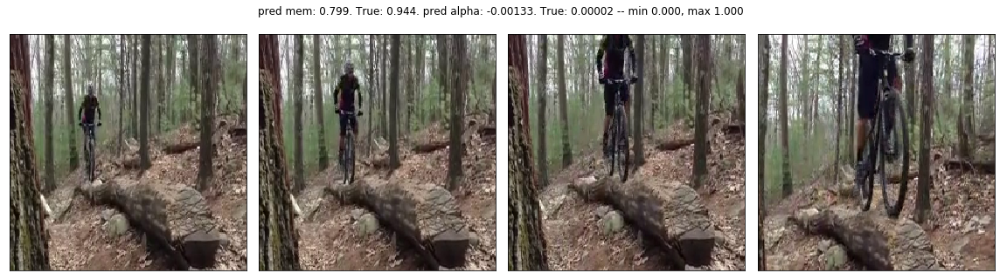

Input caption: ['<start>', 'a', 'man', 'uses', 'his', 'bike', 'to', 'ride', 'up', 'a', 'log', 'in', 'the', 'woods', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['a', 'man', 'uses', 'his', 'bike', 'to', 'ride', 'up', 'a', 'log', 'in', 'the', 'woods', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'man', 'in', 'a', 'finger', 'to', 'move', 'a', 'a', 'ramp', '<end>', 'the', 'daytime', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


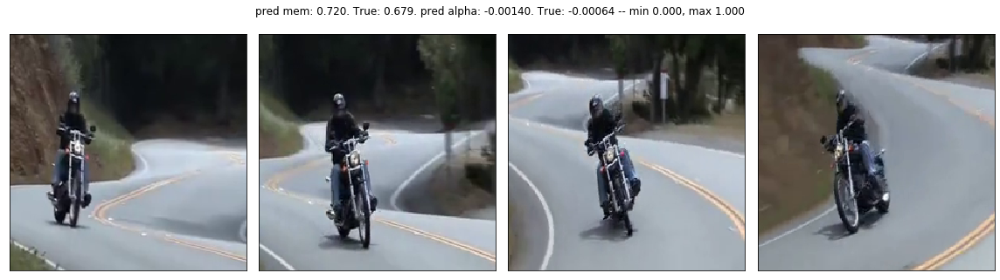

Input caption: ['<start>', 'a', 'man', 'with', 'a', 'black', 'helmet', 'rides', 'on', 'his', 'motorcycle', 'down', 'the', 'road', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['a', 'man', 'with', 'a', 'black', 'helmet', 'rides', 'on', 'his', 'motorcycle', 'down', 'the', 'road', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'man', 'in', 'a', 'red', 'jacket', 'is', 'a', 'a', 'bike', 'on', 'a', 'road', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


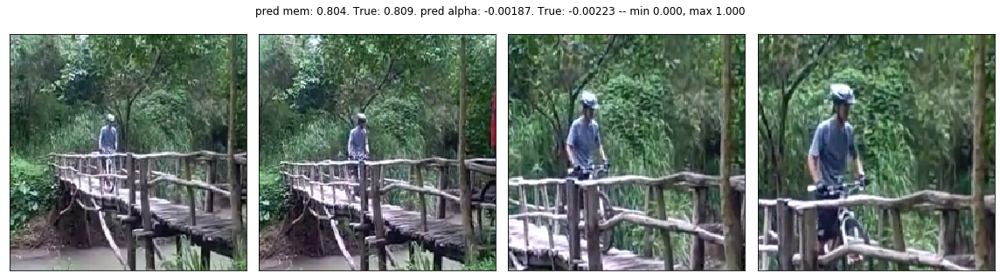

Input caption: ['<start>', 'a', 'person', 'is', 'riding', 'their', 'bike', 'across', 'the', 'wooden', 'bridge', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['a', 'person', 'is', 'riding', 'their', 'bike', 'across', 'the', 'wooden', 'bridge', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'man', 'is', 'riding', 'a', 'bike', 'down', 'the', 'street', 'path', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


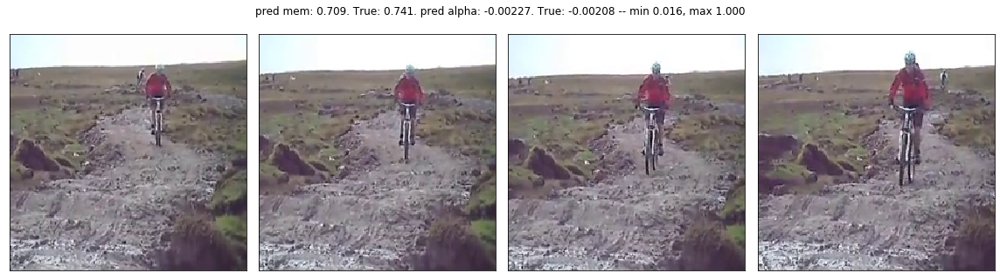

Input caption: ['<start>', 'a', 'mountain', 'bike', 'rider', 'is', 'slowly', 'rolling', 'over', 'a', 'rough', 'section', 'of', 'the', 'trail', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['a', 'mountain', 'bike', 'rider', 'is', 'slowly', 'rolling', 'over', 'a', 'rough', 'section', 'of', 'the', 'trail', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'man', 'climber', 'rider', 'is', 'pulled', 'turning', 'down', 'a', 'ramp', 'ramp', '<end>', 'dirt', 'road', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


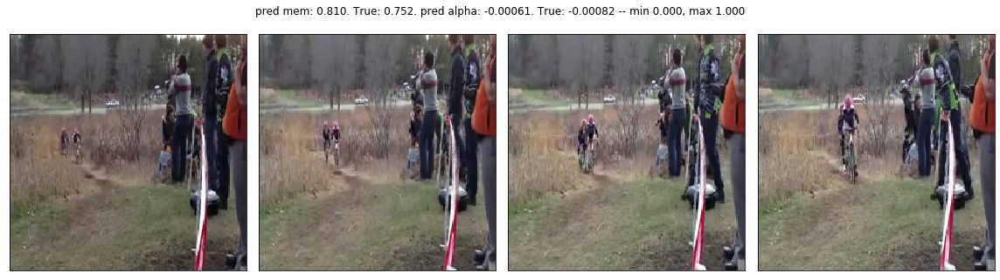

Input caption: ['<start>', 'two', 'people', 'race', 'down', 'a', 'path', 'on', 'bikes', 'while', 'others', 'watch', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['two', 'people', 'race', 'down', 'a', 'path', 'on', 'bikes', 'while', 'others', 'watch', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'people', 'are', 'a', 'a', 'dirt', 'in', 'a', 'and', 'people', 'watch', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


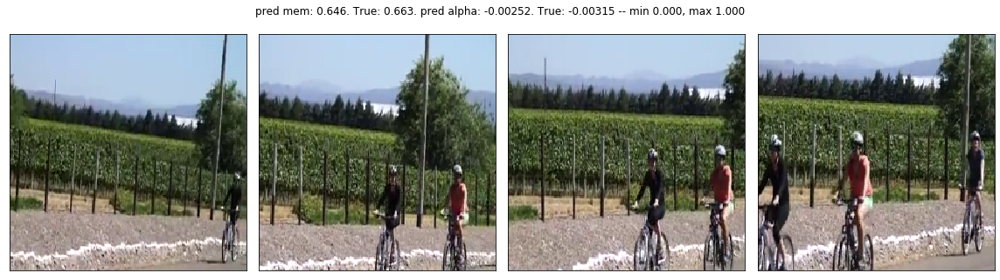

Input caption: ['<start>', 'several', 'bikers', 'wearing', 'helmets', 'approach', 'from', 'the', 'riding', 'on', 'the', 'side', 'of', 'the', 'road', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['several', 'bikers', 'wearing', 'helmets', 'approach', 'from', 'the', 'riding', 'on', 'the', 'side', 'of', 'the', 'road', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'people', 'are', 'helmets', 'are', 'a', 'a', 'side', 'track', 'a', 'road', 'of', 'a', 'road', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


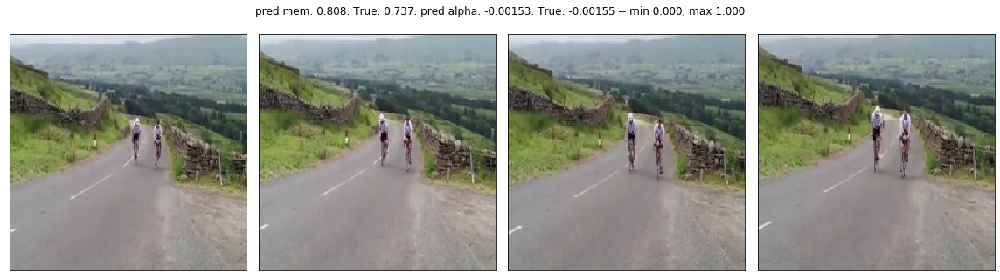

Input caption: ['<start>', 'two', 'bicycle', 'riders', 'ride', 'up', 'a', 'steep', 'hill', 'while', 'bobbing', 'back', 'and', 'forth', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['two', 'bicycle', 'riders', 'ride', 'up', 'a', 'steep', 'hill', 'while', 'bobbing', 'back', 'and', 'forth', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'people', 'riders', 'are', 'their', 'a', 'hill', 'trail', 'in', 'a', 'their', 'and', 'forth', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


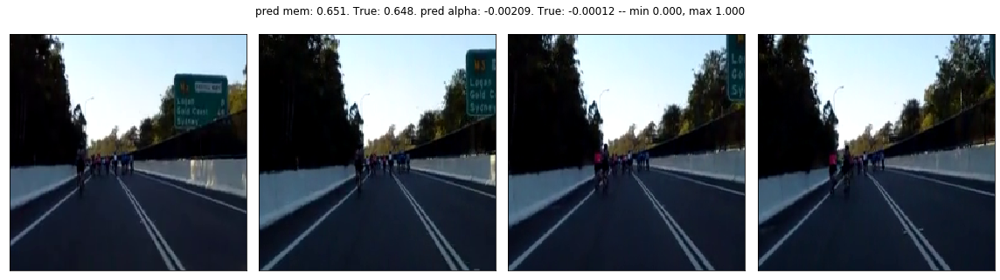

Input caption: ['<start>', 'there', 'are', 'several', 'people', 'riding', 'bicycles', 'down', 'the', 'highway', 'in', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['there', 'are', 'several', 'people', 'riding', 'bicycles', 'down', 'the', 'highway', 'in', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'are', 'people', 'people', 'playing', 'their', 'on', 'a', 'street', '<end>', 'the', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


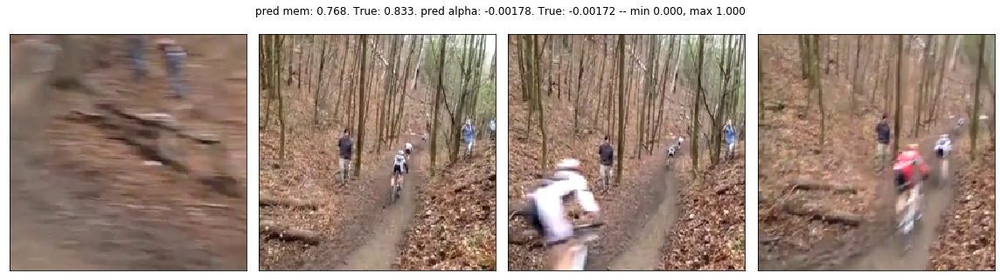

Input caption: ['<start>', 'several', 'mountain', 'bikers', 'ride', 'their', 'bikes', 'through', 'the', 'woods', 'in', 'a', 'race', 'while', 'some', 'people', 'watch', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['several', 'mountain', 'bikers', 'ride', 'their', 'bikes', 'through', 'the', 'woods', 'in', 'a', 'race', 'while', 'some', 'people', 'watch', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'people', 'cars', 'are', 'down', 'bikes', 'down', 'the', 'forest', 'on', 'the', 'forest', '<end>', 'a', 'people', 'are', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', 

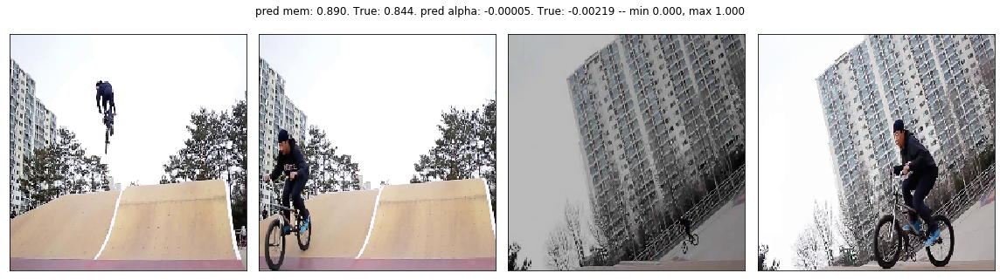

Input caption: ['<start>', 'a', 'biker', 'rides', 'over', 'a', 'wooden', 'ramp', 'and', 'lands', 'a', 'before', 'preparing', 'for', 'another', 'jump', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['a', 'biker', 'rides', 'over', 'a', 'wooden', 'ramp', 'and', 'lands', 'a', 'before', 'preparing', 'for', 'another', 'jump', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'man', 'is', 'a', 'a', 'bike', 'ledge', 'and', 'lands', 'on', 'sharp', 'stopping', '<end>', 'a', '<end>', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


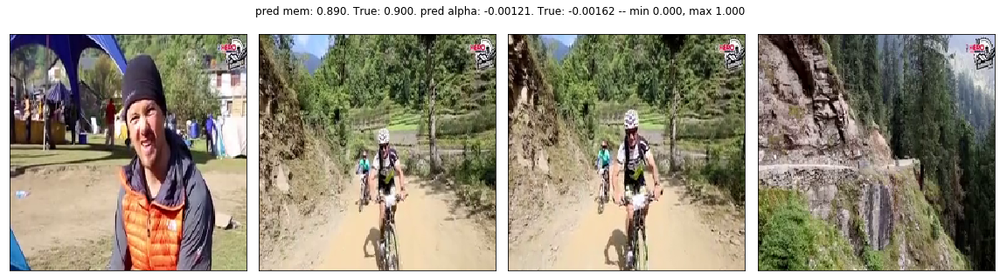

Input caption: ['<start>', 'a', 'man', 'speaks', 'then', 'two', 'people', 'riding', 'on', 'a', 'dirt', 'path', 'and', 'a', 'rocky', 'mountainside', 'are', 'shown', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['a', 'man', 'speaks', 'then', 'two', 'people', 'riding', 'on', 'a', 'dirt', 'path', 'and', 'a', 'rocky', 'mountainside', 'are', 'shown', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'man', 'in', 'to', 'to', 'other', 'stand', 'a', 'a', 'motorcycle', 'path', '<end>', 'is', 'man', 'street', '<end>', '<end>', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


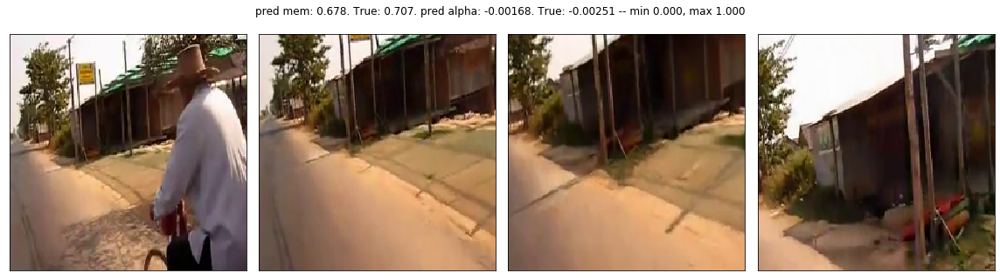

Input caption: ['<start>', 'a', 'person', 'is', 'on', 'a', 'bike', 'riding', 'down', 'the', 'road', 'on', 'the', 'right', 'side', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
seq to predict: ['a', 'person', 'is', 'on', 'a', 'bike', 'riding', 'down', 'the', 'road', 'on', 'the', 'right', 'side', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
predicted seq: ['a', 'man', 'is', 'riding', 'a', 'bike', 'riding', 'down', 'a', 'road', '<end>', 'a', 'bike', '<end>', '<end>', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0']


In [60]:
def show_results(model, inputs, labels, w = None):
    
    preds = model.predict(inputs)
    
    mem_and_alpha = preds[0]
    captions = preds[1]
    
    
    print("weights:",w)
    
    for i in range(len(mem_and_alpha)):
        
        predmem = mem_and_alpha[i][0]
        predalpha = mem_and_alpha[i][1]
        
        mem = labels[0][i][0]
        alpha = labels[0][i][1]
        
        pred_cap = captions[i]
        true_cap = labels[1][i]
        
        # Show input video, predicted mem and alpha with true mem and alpha
        plot_frames(inputs[0][i], 
                    title='pred mem: %.3f. True: %.3f. pred alpha: %.5f. True: %.5f --' % (predmem, mem, predalpha, alpha),
                    is_optical_flow=False,
                    suptitle_y=0.89,
                    is_255image=True, 
                    frames_to_show=4)
        
        # Print predicted caption and true caption
        if caption_format=='index_triangular_matrix':
            print("Input caption:", to_words(inputs[1][i]))
            print("word to predict:", to_words(np.argmax(true_cap)))
            print("predicted word:", to_words(np.argmax(pred_cap)))
        else:
            print("Input caption:", to_words(inputs[1][i]))
            print("seq to predict:", to_words([np.argmax(w) for w in true_cap]))
            print("predicted seq:", to_words([np.argmax(w) for w in pred_cap]))
        
show_results(i3d, *gen_val.__getitem__(2))

# Generate captions

In [102]:

word2idx['0']=0

def generate_captions_sentence(model, input_video, max_cap_len=50, 
                                verbose=True, gr_truth_cap = None, return_mem_alpha=False):

#     print(gr_truth_cap, gr_truth_cap.shape)
#     print(input_video.shape)
    if gr_truth_cap is not None:
        input_cap = gr_truth_cap
    else:
        input_cap = np.array([word2idx['<start>']])

    for i in range(max_cap_len-1):
#         print(to_words(input_cap[:i+1]))
        mem_alpha, cap = model.predict([[input_video], [input_cap[:i+1]]])
#         print("prediction:", " ".join(to_words([np.argmax(w) for w in cap[0]])))
        predicted_word = np.argmax(cap[0][i])
        if gr_truth_cap is None:
            input_cap = np.append(input_cap,predicted_word)
#         if verbose: print("predicted word:", to_words(predicted_word))
        
        if predicted_word == word2idx['<end>']:
            break

    if verbose: print("Final predicted caption:", " ".join(to_words(input_cap)))
    
    if return_mem_alpha:
        return input_cap, mem_alpha
    else:
        return input_cap

    
def generate_captions_wordbyword(ckpt):
    
    model = build_model_multigpu(type=data_type, 
                               model_type='i3d_cap_sentence_early',
                               image_size=cfg._IMAGE_SIZE,
                               num_frames=cfg._NUM_FRAMES, 
                               num_classes=2,
                               gpus=gpus,
                               use_pretrained=True, 
                               verbose=True, 
                               download_weights=True,
                               downsample_factor=None, 
                               dropout_prob=do, 
                               final_activation='tanh', 
                               show_internal_summary=False,
                               rescale=resc,
                               embedding_matrix=embedding_matrix,
                               output_biases=logfreq,
                               return_states=True )
    
    
#     model.load_weights(ckpt, by_name=True)
#     encoder = build_i3d
#     decoder = captioning_module
#     decoder = Model(inputs=[word,initial_states], outputs=[word, intial_states])
    

from tqdm import tqdm
def predict_sentence_generator(gen, model, forcing=False, show_vid=True, return_mem_alpha=True, verbose=True, break_it=50):
    
    captions = []
    filenames = gen.files
    j = 0
    it = 0
    
    labs=[]
    gt_labs=[]
    
    cap_mem_alpha_dict={}
    
    for ret in tqdm(gen):
        inputs = ret[0]
        labels = ret[1]
        for i in range(gen.batch_size):
            
            if show_vid:
                # Show input video, predicted mem and alpha with true mem and alpha
                plot_frames(inputs[0][i], 
                            title='%s -- True mem: %.3f. True alpha: %.5f --' % (" ".join(to_words(inputs[1][i])),labels[0][i][0],labels[0][i][1]),
                            is_optical_flow=False,
                            suptitle_y=0.95,
                            is_255image=True, 
                            frames_to_show=4)
            if forcing:
                cap, mem_alpha = generate_captions_sentence(model, 
                                                           input_video=inputs[0][i], 
                                                           gr_truth_cap = list(inputs[1][i]), 
                                                           verbose=verbose, 
                                                           return_mem_alpha=return_mem_alpha)
                
            else:
                cap, mem_alpha = generate_captions_sentence(model, 
                                                           input_video=inputs[0][i], 
                                                           verbose=verbose,
                                                           return_mem_alpha=return_mem_alpha)
                
            

            cap = " ".join(to_words(cap))
            captions.append(cap)
#             print(mem_alpha, labels[0][i][1])
#             print(filenames[it])
            cap_mem_alpha_dict[filenames[it]] = {'pred_mem_score': mem_alpha[0][0], 'pred_alpha': mem_alpha[0][1], 'gt_mem_score': labels[0][i][0], 'gt_alpha': labels[0][i][1], 'caption': cap}
#             print(cap_mem_alpha_dict[filenames[it]])
        it+=1
        if break_it is not None and it >= break_it:
            break
    
    if return_mem_alpha:
        return cap_mem_alpha_dict
    else:
        return captions

gen_test.batch_size = 1
cap_mem_alpha_dict = predict_sentence_generator(gen_test, i3d, forcing=False, show_vid=False, return_mem_alpha=True, verbose = False, break_it = None) #len(gen_test))    

 27%|██▋       | 410/1500 [05:45<16:08,  1.13it/s]


Total time on this batch: 0.03209768608212471  - it: 500 - idx: 410
Time loading: 0.02121426071971655
Time preprocessing: 0.010879637207835913
Time augmenting: 3.788154572248459e-06


 61%|██████    | 910/1500 [13:01<08:03,  1.22it/s]


Total time on this batch: 0.032969874795526266  - it: 1000 - idx: 910
Time loading: 0.02177846385166049
Time preprocessing: 0.011188447941094637
Time augmenting: 2.963002771139145e-06


 94%|█████████▍| 1410/1500 [20:10<01:14,  1.21it/s]


Total time on this batch: 0.03206581296399236  - it: 1500 - idx: 1410
Time loading: 0.02100077085196972
Time preprocessing: 0.011061267927289009
Time augmenting: 3.7741847336292267e-06


100%|██████████| 1500/1500 [21:28<00:00,  1.16it/s]


In [106]:
cap_mem_alpha_dict

{'adult-female-singing_peeks-www_k_to_keek_4c6xeab_31.npy': {'pred_mem_score': 0.90719783,
  'pred_alpha': -0.0015887661,
  'gt_mem_score': 0.9414892542415338,
  'gt_alpha': -0.0014586271126860158,
  'caption': '<start> a man in a blue shirt is talking to the camera <end>'},
 'adult-female-singing_peeks-www_k_to_keek_7c6xeab_32.npy': {'pred_mem_score': 0.9198095,
  'pred_alpha': -0.0010148165,
  'gt_mem_score': 1.0,
  'gt_alpha': 0.0,
  'caption': '<start> a man in a black shirt and glasses is talking to the camera <end>'},
 'adult-male-singing_peeks-www_k_to_keek_PIAeeab_14.npy': {'pred_mem_score': 0.57105595,
  'pred_alpha': -0.0022829494,
  'gt_mem_score': 0.6891503928282984,
  'gt_alpha': -0.0020415148798516468,
  'caption': '<start> a group of people are gathered together in a room <end>'},
 'adult-male-singing_peeks-www_k_to_keek_eyZieab_4.npy': {'pred_mem_score': 0.82189536,
  'pred_alpha': -0.0006517249,
  'gt_mem_score': 0.9407212921094383,
  'gt_alpha': -0.0008109599040053977

In [116]:
# Save cap mem alpha dict

for k,v in cap_mem_alpha_dict.items():
    cap_mem_alpha_dict[k] = {'pred_mem_score': float(v['pred_mem_score']),
                              'pred_alpha': float(v['pred_alpha']),
                              'gt_mem_score': float(v['gt_mem_score']),
                              'gt_alpha': float(v['gt_alpha']),
                              'caption': v['caption'].replace("<start>","").replace("<end>","")}

# json.dump(cap_mem_alpha_dict, open("cap_mem_alpha_dict_0.6023.json", "w+"))


In [151]:
# check save
cap_mem_alpha_dict_loaded = json.load(open("cap_mem_alpha_dict_0.6023.json", "r"))

pred_mem_score = []
gt_mem_score = []
for k,v in cap_mem_alpha_dict_loaded.items():
    pred_mem_score.append(v['pred_mem_score'])
    gt_mem_score.append(v['gt_mem_score'])
rc = spearmanr(pred_mem_score, gt_mem_score)
print('RC:', rc[0])

RC: 0.60413888948763


In [158]:
# Load VA and Flow predictions

va_only = pickle.load(open('../preds/va_only0.6012401.pkl', "rb"))
flow_only = pickle.load(open('../preds/flow_only0.5768269121.pkl', "rb"))
semantic_memnet = pickle.load(open('../preds/semantic_memnet0.66.pkl', "rb"))
temporal_memnet = pickle.load(open('../preds/temporal_memnet0.65937.pkl', "rb"))
print(len(va_only), len(flow_only), len(semantic_memnet), len(temporal_memnet))

def compute_RC_new_dataset(mem_dict):
    pred_mem_score=[]
    gt_mem_score=[]
    for k,v in cap_mem_alpha_dict_loaded.items():
        if k[:-4]+'.mp4' not in mem_dict:
            print(k[:-4]+'.mp4', "not in mem_dict")
            pred_mem_score.append(v['gt_mem_score'])
        else:
            pred_mem_score.append(mem_dict[k[:-4]+'.mp4'])
        gt_mem_score.append(v['gt_mem_score'])
    rc = spearmanr(pred_mem_score, gt_mem_score)
    print('RC for given dict:', rc[0])           
    
def average_RCs(mem_dicts, cap_mem_alpha_dict):
    pred_mem_score = []
    gt_mem_score = []
    
    cap_mem_alpha_dict_copy = deepcopy(cap_mem_alpha_dict)
    
    for k,v in cap_mem_alpha_dict.items():
        acc_pred_mem = 0
        for m in mem_dicts:
            if k[:-4]+'.mp4' not in m:
                print(k[:-4]+'.mp4', "not in mem_dict")
                acc_pred_mem += v['gt_mem_score']
            else:
                acc_pred_mem += m[k[:-4]+'.mp4']
        pred_mem_score.append((v["pred_mem_score"] + acc_pred_mem) / (len(mem_dicts)+1) )
        gt_mem_score.append(v['gt_mem_score'])
        cap_mem_alpha_dict_copy[k]["pred_mem_score"] = pred_mem_score[-1]
    rc = spearmanr(pred_mem_score, gt_mem_score)
    print('Average over all 3 streams:', rc[0])
    
    return cap_mem_alpha_dict_copy

print("va_only")
compute_RC_new_dataset(va_only) 
print("flow_only")
compute_RC_new_dataset(flow_only) 
print("semantic_memnet")
compute_RC_new_dataset(semantic_memnet) 
print("temporal_memnet")
compute_RC_new_dataset(temporal_memnet) 

print()
print()
cap_mem_alpha_dict_copy = average_RCs([va_only, flow_only], cap_mem_alpha_dict_loaded)

1505 1505 1505 1505
va_only
scratching_flickr-0-5-6-3-9-7-9-2-3905639792_4.mp4 not in mem_dict
shooting_flickr-2-9-6-7-0-0-5-1-4829670051_2.mp4 not in mem_dict
RC for given dict: 0.60033210557012
flow_only
scratching_flickr-0-5-6-3-9-7-9-2-3905639792_4.mp4 not in mem_dict
shooting_flickr-2-9-6-7-0-0-5-1-4829670051_2.mp4 not in mem_dict
RC for given dict: 0.5793283804280034
semantic_memnet
scratching_flickr-0-5-6-3-9-7-9-2-3905639792_4.mp4 not in mem_dict
shooting_flickr-2-9-6-7-0-0-5-1-4829670051_2.mp4 not in mem_dict
RC for given dict: 0.6592540340322409
temporal_memnet
scratching_flickr-0-5-6-3-9-7-9-2-3905639792_4.mp4 not in mem_dict
shooting_flickr-2-9-6-7-0-0-5-1-4829670051_2.mp4 not in mem_dict
RC for given dict: 0.6592540340322409


scratching_flickr-0-5-6-3-9-7-9-2-3905639792_4.mp4 not in mem_dict
scratching_flickr-0-5-6-3-9-7-9-2-3905639792_4.mp4 not in mem_dict
shooting_flickr-2-9-6-7-0-0-5-1-4829670051_2.mp4 not in mem_dict
shooting_flickr-2-9-6-7-0-0-5-1-4829670051_2.mp4 no

In [161]:
# save semantic memnet predictions

json.dump(cap_mem_alpha_dict_copy, open("cap_mem_alpha_dict_semanticmemnet_0.6628.json", "w+"))


## Save generated captions

In [56]:
# save captions

def save_captions(captions, filepath, fmt='txt'):
    
    if fmt == 'txt':
        with open(filepath, "w+") as f:
            for c in captions:
                if "<start>" in c: c=c.replace("<start> ", "")
                if "<end>" in c: c=c.replace(" <end>", "")
                f.write("%s\n"%c)
                
    elif fmt == 'pkl':
        with open(filepath, 'wb+') as f:
            pickle.dump(mem_alpha_captions, f)
    elif fmt == 'json':
        with open(filepath, 'w+') as f:
            json.dump(mem_alpha_captions, f)
            
    print("Captions dumped to %s" % fmt)
    
            
def load_captions(captions, filepath, fmt='pkl'):

    if fmt == 'pkl':
        with  open(filepath, 'wb+') as f:
            cap = pickle.load(mem_alpha_captions, f)
    return cap

save_captions(mem_alpha_captions, "") #"test_pred_captions_" + W.split('/')[-1] + ".txt")

Captions dumped to txt


In [55]:
with open("../../memento_data/memento_test_tokenized_captions_3.json", "r") as f:
    tok_captions_test = json.load(f)
    
refs = {0:[], 1:[], 2:[]}
    
for k in sorted(tok_captions_test.keys()):
    for i in range(3):
        cap = " ".join(tok_captions_test[k]["tokenized_captions"][i])
        refs[i].append(cap)

for k,v in refs.items():
    save_captions(v, "refs_test_%d.txt" % (k+1))

Captions dumped to txt
Captions dumped to txt
Captions dumped to txt


In [57]:
!nlg-eval --hypothesis=test_pred_caps_att.txt --references=refs_test_1.txt --references=refs_test_2.txt --references=refs_test_3.txt

Could not determine location of data.
Run `nlg-eval --setup DATA_DIR' to download or set $NLGEVAL_DATA to an existing location


# Predict and Evaluate RC

In [ ]:
%%bash
cd ../ckpt/i3d_cap
ls -lrt
# rm memento10k_rgb_fzn0_resc1_LTmse_a1b100c1000_w1_gpus1_bs12_do0.30_ep02_valloss1.6941_valrc-0.2105_capacc0.069.hdf5

In [ ]:
# Load model if necessary
# W = '../ckpt/i3d_cap/memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c10_w0_gpus1_bs16_do0.30_ep01_valloss12.2976_valrc0.6252_capacc0.388.hdf5'
# i3d.load_weights(W)

In [82]:
# Predict
from copy import deepcopy
gen_bs1=deepcopy(gen_test)
gen_bs1.batch_size=1

preds = i3d.predict_generator(gen_bs1, verbose=1)

 488/1500 [========>.....................] - ETA: 1:21
Total time on this batch: 0.04984372016042471  - it: 500 - idx: 499
Time loading: 0.036209643352776766
Time preprocessing: 0.013630814850330353
Time augmenting: 3.2619573175907135e-06
 988/1500 [==================>...........] - ETA: 41s
Total time on this batch: 0.04376066382974386  - it: 1000 - idx: 999
Time loading: 0.030477886088192463
Time preprocessing: 0.013279918115586042
Time augmenting: 2.8596259653568268e-06
1488/1500 [============================>.] - ETA: 0s
Total time on this batch: 0.06487323390319943  - it: 1500 - idx: 1499
Time loading: 0.041007902938872576
Time preprocessing: 0.023861079942435026
Time augmenting: 4.251021891832352e-06
1500/1500 [==============================] - 121s 81ms/step


In [85]:
# Calculate metrics with predictions
def calculate_RC_and_alphaRC(preds, gen_bs1, name_to_mem_alpha):
    pred_mem = [p[0] for p in preds[0]]
    pred_alpha = [p[1] for p in preds[0]]

    true_mem=[]
    true_alpha=[]

    verbose=False

    for i,n in enumerate(gen_bs1.files):
        if verbose:
            print('Name:',n)
            print('True mem:',name_to_mem_alpha[n][0])
            print('Pred mem:',pred_mem[i])
            print('True alpha:',name_to_mem_alpha[n][1])
            print('Pred alpha:',pred_alpha[i])
        true_mem.append(name_to_mem_alpha[n][0])
        true_alpha.append(name_to_mem_alpha[n][1])

    print('First 8 gt mem:', true_mem[:8])
    print('First 8 pred mem:', pred_mem[:8])

    # assert(len(preds)==len(val_names))

    print("len(pred_mem), len(true_mem)",len(pred_mem), len(true_mem))
    rc = spearmanr(pred_mem, true_mem)
    alpha_rc = spearmanr(pred_alpha, true_alpha)


    print('RC:', rc[0])
    print('Alpha_rc:',alpha_rc[0])
    
    return pred_mem, true_mem
    
pred_mem, true_mem = calculate_RC_and_alphaRC(preds, gen_bs1, name_to_mem_alpha);

First 8 gt mem: [0.9414892542415338, 1.0, 0.6891503928282984, 0.9407212921094383, 0.8434908852354707, 0.9039953298330088, 0.9538496390961118, 0.9541418170314]
First 8 pred mem: [0.8998501, 0.9212499, 0.6127837, 0.8579148, 0.8072031, 0.8198838, 0.8646312, 0.8809171]
len(pred_mem), len(true_mem) 1500 1500
RC: 0.5958036128867645
Alpha_rc: 0.18127211450429276


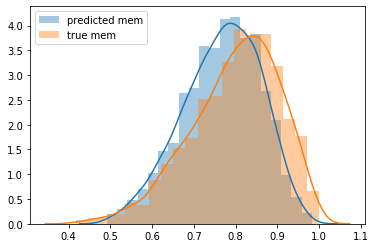

In [84]:
# Plot distribution of memorability scores
sns.distplot(pred_mem,bins=20,label="predicted mem")
sns.distplot(true_mem,bins=20,label="true mem")
plt.legend()

# Evaluate many checkpoints at once

Evaluating ../ckpt/i3d_cap2/memento10k_rgb_fzn0_resc1_LTalphamse_a1b100c1000_w0_gpus1_bs12_do0.30_ep11_valloss13.1357_valrc0.5942_capacc0.391.hdf5
 488/1506 [========>.....................] - ETA: 1:12
Total time on this batch: 0.04092726204544306  - it: 500 - idx: 499
Time loading: 0.027932771015912294
Time preprocessing: 0.012991104740649462
Time augmenting: 3.38628888130188e-06
 549/1506 [=========>....................] - ETA: 1:07[Errno 2] No such file or directory: '../../../../../../Datasets/memento_raw/sources_numpy_256/howling_8_8Pk7pwNUI_4.npy'
Exception caught with video: howling_8_8Pk7pwNUI_4.npy
 819/1506 [===============>..............] - ETA: 48s[Errno 2] No such file or directory: '../../../../../../Datasets/memento_raw/sources_numpy_256/riding_flickr-4-1-7-6245850417_21.npy'
Exception caught with video: riding_flickr-4-1-7-6245850417_21.npy
 889/1506 [================>.............] - ETA: 44s[Errno 2] No such file or directory: '../../../../../../Datasets/memento_raw/s

KeyboardInterrupt: 

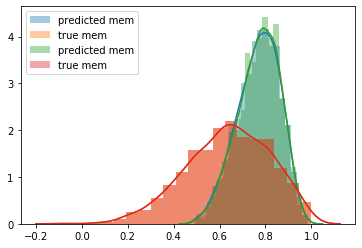

In [55]:
def eval_many_ckpts(ckpts_to_eval, gen_bs1, name_to_mem_alpha, plot_dist=True):
    for w in ckpts_to_eval:
        print("Evaluating", w)
        i3d.load_weights(w)
        preds = i3d.predict_generator(gen_bs1, verbose=1)
        
        pred_mem, true_mem = calculate_RC_and_alphaRC(preds, gen_bs1, name_to_mem_alpha)
        
        if plot_dist:
            sns.distplot(pred_mem,bins=20,label="predicted mem")
            sns.distplot(true_mem,bins=20,label="true mem") 
            plt.legend()
        print()
        
gen_bs1=deepcopy(gen_test)
gen_bs1.batch_size=1

ckpt_base = '../ckpt/i3d_cap2'
ckpts_to_eval = [os.path.join(ckpt_base, w) for w in os.listdir(ckpt_base)]
eval_many_ckpts(ckpts_to_eval, gen_bs1, name_to_mem_alpha, plot_dist = True)

# Test embedding module

In [ ]:
from keras_models import captioning_module_with_emb_output
max_cap_len = 50

cap_model = captioning_module_with_emb_output(Input(shape=(max_cap_len,)), embedding_matrix)

k=3
pred, emb = cap_model.predict(np.array(range(max_cap_len)).reshape(1,-1))
print("Expected embedding:", embedding_matrix[0])
print("Predicted embedding:", emb[0][0])

In [48]:
print(test_names)

['adult-female-singing_peeks-www_k_to_keek_4c6xeab_31.npy', 'adult-female-singing_peeks-www_k_to_keek_7c6xeab_32.npy', 'adult-male-singing_peeks-www_k_to_keek_PIAeeab_14.npy', 'adult-male-singing_peeks-www_k_to_keek_eyZieab_4.npy', 'adult-male-speaking_VKjyBq-cctQ_25.npy', 'aiming_5-7-8-4-4-1-7-5-3357844175.npy', 'aiming_flickr-0-3-1-9-2-3-2-8-4003192328_1.npy', 'arresting_meta-11491085_3.npy', 'ascending_flickr_R-7-6-1-2-7-7-8-9-9676127789_16.npy', 'attacking_flickr-1-2-1-4-0-3-4-1-6412140341_84.npy', 'baking_flickr-2-6-9-4-0-2-5-5-23726940255_1.npy', 'baking_flickr-9-0-7-1-9-5-6-1-19790719561_5.npy', 'baptizing_bing-vimeo_com_112947488_148.npy', 'barbecuing_0-0-3-2-8-4-8-1-5700328481.npy', 'barking_uIR8RtI9kaw_3.npy', 'bathing_1-7-1-3-7-1-3-6-7317137136.npy', 'bathing_3-0-9-3613316309.npy', 'bathing_5-1-1-5-6-2-8-5-4351156285.npy', 'bathing_7-4-0-7-1-5-1-2-14074071512.npy', 'bathing_8-0-9-4-1-5-2-0-3480941520.npy', 'bathing_flickr-3-0-7-2-2-9-2-0-4830722920_23.npy', 'bathing_flickr-4

In [ ]:
print(preds)